# Анализ рынка общественного питания в Москве


# Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. А затем, сделать информативную и лаконичную презентацию.

# Описание данных

**Файл moscow_places.csv:**

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений. Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число. Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений. Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число. Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки): 0 — заведение не является сетевым 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Загрузка данных и изучение общей информации

In [1]:
!pip install missingno

In [2]:
import pandas as pd
import numpy as np
import math
from scipy import stats as st
import seaborn as sns
import matplotlib.pyplot as plt
import re
import plotly.express as px
import plotly.graph_objects as go
import missingno as msno
import json
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

In [3]:
df = pd.read_csv('/datasets/moscow_places.csv')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
print('Количество заведений:', df['name'].nunique())

Количество заведений: 5614


В датсете 14 столбцов, 8406 строк, названия столбцов корректные, в данных есть пропуски, большинство данных типа object и float. Количество заведений 5614

## Предобработка данных

- Создать столбец street с названиями улиц из столбца с адресом.
- Создать столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): логическое значение True — если заведение работает ежедневно и круглосуточно; логическое значение False — в противоположном случае.

In [6]:
#явные дубликаты в данных
df.duplicated().sum()

0

In [7]:
df[df.duplicated(['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [8]:
df['name'].unique()

array(['WoWфли', 'Четыре комнаты', 'Хазри', ..., 'Миславнес', 'Самовар',
       'Kebab Time'], dtype=object)

In [9]:
df['name'].value_counts()

Кафе                    189
Шоколадница             120
Домино'с Пицца           76
Додо Пицца               74
One Price Coffee         71
                       ... 
Два гуся                  1
Остерия Марио             1
Fresh for you & Cofe      1
Церковный хлѣбъ           1
Эссе                      1
Name: name, Length: 5614, dtype: int64

In [10]:
df['address'].unique()

array(['Москва, улица Дыбенко, 7/1', 'Москва, улица Дыбенко, 36, корп. 1',
       'Москва, Клязьминская улица, 15', ...,
       'Москва, улица Лобачевского, 52, корп. 1',
       'Москва, Болотниковская улица, 52, корп. 2',
       'Москва, Чонгарский бульвар, 26А, корп. 1'], dtype=object)

In [11]:
df['address'].value_counts()

Москва, проспект Вернадского, 86В        28
Москва, Усачёва улица, 26                26
Москва, площадь Киевского Вокзала, 2     20
Москва, Ярцевская улица, 19              20
Москва, Каширское шоссе, 61Г             16
                                         ..
Москва, шоссе Энтузиастов, 86, стр. 7     1
Москва, улица Усиевича, 22, стр. 2        1
Москва, Пятницкая улица, 24               1
Москва, Гостиничный проезд, 6к2           1
Москва, Можайское шоссе, 41, корп. 1      1
Name: address, Length: 5753, dtype: int64

На улицах, где есть уникальные заведения, расположены торговые центры в основном, поэтому вполне могут быть такие данные

In [12]:
#количество пропусков
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.
Пропусков в данных очень много, пэтому просто удалить не получится, будут искажения в исследовании.

Долго думала, как заполнить пропуски, считаю, что заполнять средними или медианными значениями по названию заведения остальные столбцы некорректно, тк количество мест в сетевых заведениях, цена, в разных районах, может значительно отличаться. Также, возможен такой варинат, что заведение только открылось и данные по нему не собраны. Также в мелких сетях, по условию, могут быть ошибки, поэтому было принято решение оставить пропуски как есть. Заполнять нулями, думаю, смысла большого не имеет. Единственное, что еще можно сделать для дальнейшего исследования - это посмотреть выбросы в кол-ве мест.

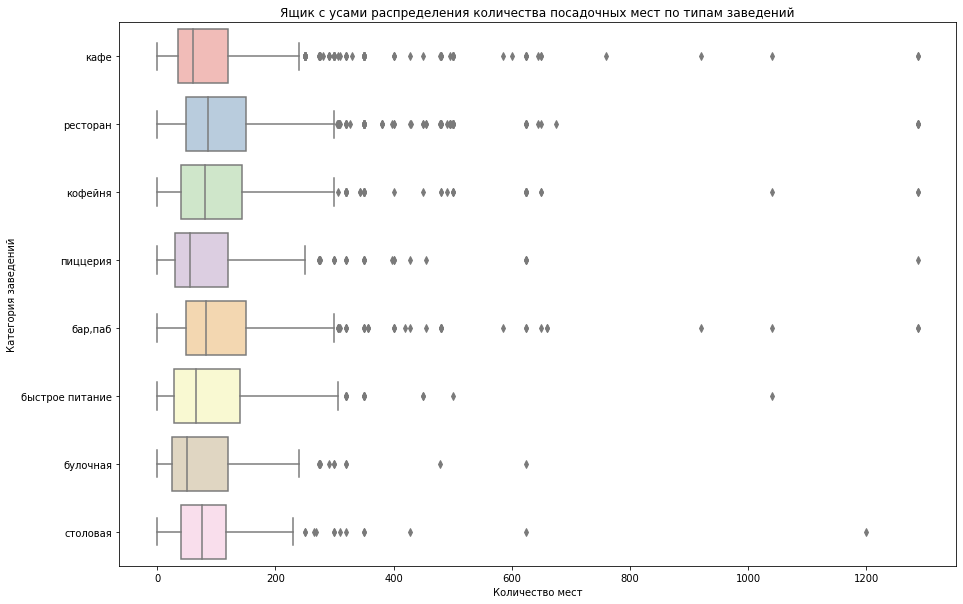

In [13]:
plt.figure(figsize=(15, 10))
ax = sns.boxplot(data=df, x='seats', y='category', palette="Pastel1")
plt.title('Ящик с усами распределения количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Категория заведений')
plt.show()

Думаю, что тут тоже удалять данные некорректно, тк вдруг действительно есть заведения с 400+ мест

In [14]:
#Создадим столбец street с названиями улиц из столбца с адресом

words = ['проезд','пр.','прзд.','шоссе','шос.','ш.','улица','ул.','переулок','пер.','микрорайон','мкр.','мкрн.', \
         'мкад','Московской Кольцевой Автодороги','деревня','проспект','пр.','площадь','пл','село','аллея','бульвар', \
         'набережная','наб.','тупик','линия','посёлок','территория','квартал','просек','вблизи', 'парк','мост']
 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
 
df['street'] = df['address'].str.extract(str_pat, flags=re.I)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [15]:
df[df['street'].isna()].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,NaN
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,NaN
64,Testo мания,кофейня,"Москва, Лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN
73,Веранда,ресторан,"Москва, парк Алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,1,NaN,NaN
137,Get and fly,ресторан,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880350,37.530713,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN


В новом столбце появились пропуски, тк после элемента с ключевым словом нет запятой или вообще нет ключевого слова, поэтому оставим пропуски как есть.

In [16]:
#Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


## Анализ данных

- Какие категории заведений представлены в данных? Исследовать количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации. Ответить на вопрос о распределении заведений по категориям.
- Исследовать количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации. Проанализировать результаты и сделать выводы.
- Рассмотреть и изобразить соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
- Какие категории заведений чаще являются сетевыми? Исследовать данные и ответить на вопрос графиком.
- Сгруппировать данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построить подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?
- Какие административные районы Москвы присутствуют в датасете? Отобразить общее количество заведений и количество заведений каждой категории по районам. Попробовать проиллюстрировать эту информацию одним графиком.
- Визуализировать распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
- Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).
- Отобразить все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
- Найти топ-15 улиц по количеству заведений. Построить график распределения количества заведений и их категорий по этим улицам. Попробовать проиллюстрировать эту информацию одним графиком.
- Найти улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?
- Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитать медиану этого столбца для каждого района. Использовать это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализировать цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

**1. Какие категории заведений представлены в данных? Исследовать количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации. Ответить на вопрос о распределении заведений по категориям.**

In [17]:
colors = sns.color_palette('pastel')

In [18]:
category_name = df.groupby('category')['name'].count().reset_index()
category_name.columns = ['category', 'count']
category_name

,category,count
0,"бар,паб",765
1,булочная,256
2,быстрое питание,603
3,кафе,2378
4,кофейня,1413
5,пиццерия,633
6,ресторан,2043
7,столовая,315


In [19]:
fig = go.Figure(data=[go.Pie(labels=category_name['category'], values=category_name['count'])], 
          layout=go.Layout(title=go.layout.Title(text="Круговая диаграмма категорий заведений")))
fig.show() 

In [20]:
fig = px.bar(category_name, 
             x='category', 
             y='count', 
             text='count',
             title='График распределении заведений по категориям')
fig.update_layout(xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show() 

**Вывод:**

Больше всего заведений из категории кафе (2378, 28.3%), далее - рестораны (2043, 24.3%) и кофйени (1413, 16.8%). Столовых и булочных меньше всего (3.75% и 3.05% соответственно)

**2. Исследовать количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построить визуализации. Проанализировать результаты и сделать выводы.**

In [21]:
df.groupby('category')['seats'].describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",468.0,124.532051,145.011574,0.0,48.00,82.5,150.0,1288.0
булочная,148.0,89.385135,97.685844,0.0,25.00,50.0,120.0,625.0
быстрое питание,349.0,98.891117,106.611739,0.0,28.00,65.0,140.0,1040.0
кафе,1218.0,97.512315,117.985084,0.0,35.25,60.0,120.0,1288.0
кофейня,751.0,111.199734,127.837772,0.0,40.00,80.0,144.0,1288.0
пиццерия,427.0,94.496487,112.282703,0.0,30.00,55.0,120.0,1288.0
ресторан,1270.0,121.944094,123.757335,0.0,48.00,86.0,150.0,1288.0
столовая,164.0,99.750000,122.951453,0.0,40.00,75.5,117.0,1200.0


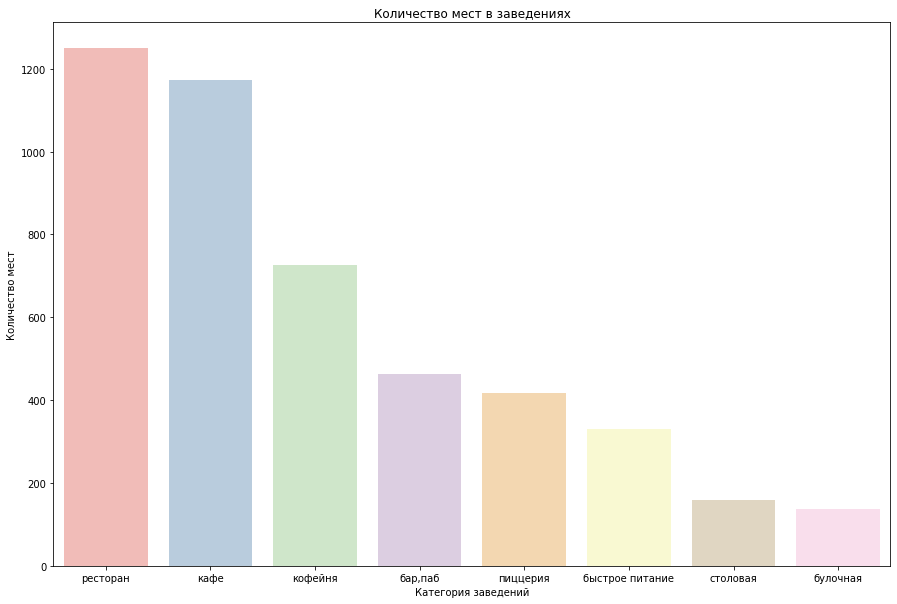

In [22]:
seats = df[df['seats'] != 0].groupby('category')['seats'].count().reset_index().sort_values(by='seats', ascending=False).round(2)

f, ax = plt.subplots(figsize=(15, 10))

ax = sns.barplot(data=seats, x='category', y='seats', palette="Pastel1")

ax.set_xlabel('Категория заведений')
ax.set_ylabel('Количество мест')
ax.set_title('Количество мест в заведениях')

plt.show()

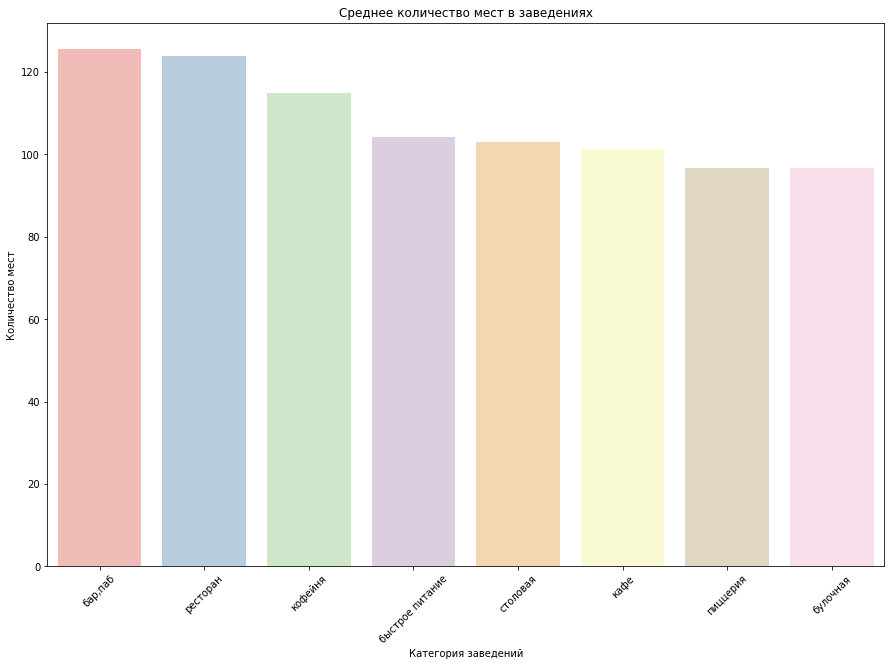

In [23]:
mean_seats = df[df['seats'] != 0].groupby('category')['seats'].mean().reset_index().sort_values(by='seats', ascending=False).round(2)

f, ax = plt.subplots(figsize=(15, 10))

ax = sns.barplot(data=mean_seats, x='category', y='seats', palette="Pastel1")

ax.set_xlabel('Категория заведений')
ax.set_ylabel('Количество мест')
ax.set_title('Среднее количество мест в заведениях')
plt.xticks(rotation=45)
plt.show()

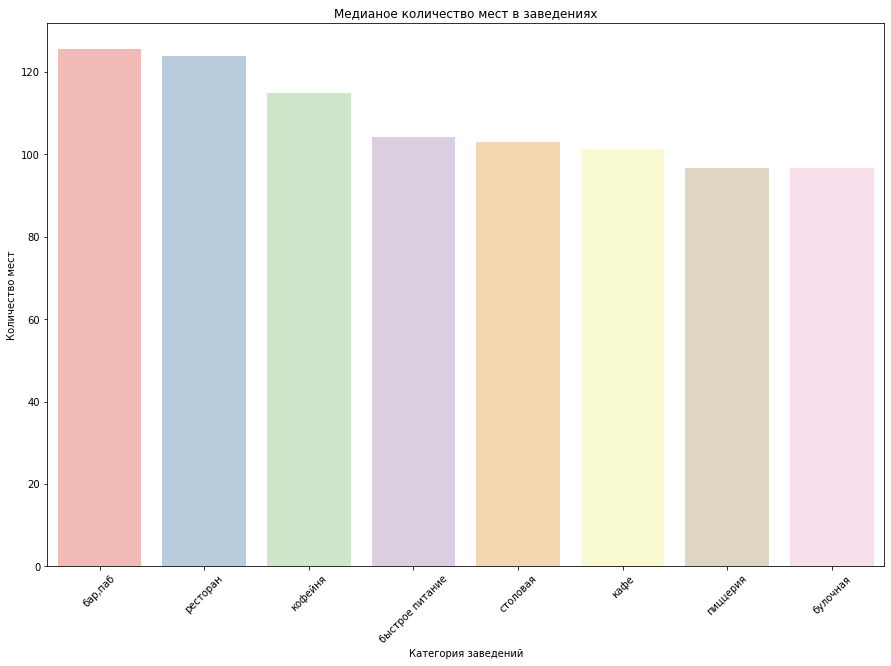

In [24]:
median_seats = df[df['seats'] != 0].groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False).round(2)

f, ax = plt.subplots(figsize=(15, 10))

ax = sns.barplot(data=mean_seats, x='category', y='seats', palette="Pastel1")

ax.set_xlabel('Категория заведений')
ax.set_ylabel('Количество мест')
ax.set_title('Медианое количество мест в заведениях')
plt.xticks(rotation=45)
plt.show()

**Вывод:**

Больше всего посадочных мест в ресторанах, кафе и кофейнях, меньше всего в булочных и столовых

**3. Рассмотреть и изобразить соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**

In [25]:
chain = df['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5201
1,1,3205


In [26]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

**Вывод:**

Сетевых заведений 3205 или 38.1% и несетевых 5201 или 61.9%

**4. Какие категории заведений чаще являются сетевыми? Исследовать данные и ответить на вопрос графиком.**

In [27]:
chain2 = df.groupby(['category', 'chain'])['name'].count().reset_index()
chain2.columns = ['object_type', 'chain', 'count']
chain2['chain'] = chain2['chain'].astype(object)
chain2 = chain2.sort_values(['count', 'chain'])
chain2

,object_type,chain,count
15,столовая,1,88
2,булочная,0,99
3,булочная,1,157
1,"бар,паб",1,169
14,столовая,0,227
5,быстрое питание,1,232
10,пиццерия,0,303
11,пиццерия,1,330
4,быстрое питание,0,371
0,"бар,паб",0,596


In [28]:
chain2_2 = chain2.query('chain == 1').sort_values(by='count', ascending=False)
chain2_2

,object_type,chain,count
7,кафе,1,779
13,ресторан,1,730
9,кофейня,1,720
11,пиццерия,1,330
5,быстрое питание,1,232
1,"бар,паб",1,169
3,булочная,1,157
15,столовая,1,88


In [29]:
fig = px.bar(chain2, 
             x='count', 
             y='object_type', 
             text='count', 
             barmode='stack',                  
             color='chain',
             category_orders={"chain": ["сетевой", "несетевой"]})
fig.update_layout(title='Соотношение сетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название категорий',
                   yaxis={'categoryorder':'total ascending'})
fig.show()

**Вывод:**

Чаще всего сетевыми являются кафе, рестораны, кофейни.

**5. Сгруппировать данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построить подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?**

In [30]:
category_name2 = (df.pivot_table(index='name', values='category', aggfunc='count')
           .rename(columns={'name':'name','category': 'count'})).reset_index() 

category_name2 = category_name2.sort_values(by='count',ascending=False).reset_index().head(15)
category_name2

,index,name,count
0,2890,Кафе,189
1,5522,Шоколадница,120
2,2584,Домино'с Пицца,76
3,2551,Додо Пицца,74
4,1156,One Price Coffee,71
5,5595,Яндекс Лавка,69
6,419,Cofix,65
7,1290,Prime,50
8,5083,Хинкальная,44
9,5421,Шаурма,43


In [31]:
fig = px.bar(category_name2, 
             x='name', 
             y='count', 
             text='count',
             color='name')
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Заведения',
                   yaxis_title='Количество заведений', height=700,
                 width=900, showlegend=False)
fig.show()

In [32]:
#посмотрим к какой категории относятся заведения
category_name2_2 = (df.pivot_table(index=['category','name'], values='chain', aggfunc='count')
           .rename(columns={'chain': 'count'})).reset_index() 

category_name2_2 = category_name2_2.groupby(['category','name']).agg({'count' : 'sum'}).sort_values(by='count',ascending=False).head(15)
category_name2_2

count
category        name                                      
кафе            Кафе                                   159
кофейня         Шоколадница                            119
пиццерия        Домино'с Пицца                          76
                Додо Пицца                              74
кофейня         One Price Coffee                        71
ресторан        Яндекс Лавка                            69
кофейня         Cofix                                   65
ресторан        Prime                                   49
кофейня         КОФЕПОРТ                                42
кафе            Кулинарная лавка братьев Караваевых     39
ресторан        Теремок                                 36
                Ресторан                                33
быстрое питание Шаурма                                  32
кофейня         CofeFest                                31
кафе            Чайхана                                 26

**Вывод:**

Можно сказать, что в топ-15 лидируют кафе с названиями "кафе"и кофейня шоколадница

**6. Какие административные районы Москвы присутствуют в датасете? Отобразить общее количество заведений и количество заведений каждой категории по районам. Попробовать проиллюстрировать эту информацию одним графиком.**

In [33]:
districts = (df.pivot_table(index=['district','category'], values='chain', aggfunc='count')
           .rename(columns={'chain': 'count'})).reset_index() 
districts_1 = districts.groupby(['district','category']).agg({'count' : 'sum'}).sort_values(by='count',ascending=False)
districts_1

count
district                               category       
Центральный административный округ     ресторан    670
                                       кафе        464
                                       кофейня     428
                                       бар,паб     364
Юго-Восточный административный округ   кафе        282
...                                                ...
Северо-Западный административный округ бар,паб      23
                                       столовая     18
Юго-Западный административный округ    столовая     17
Юго-Восточный административный округ   булочная     13
Северо-Западный административный округ булочная     12

[72 rows x 1 columns]

In [34]:
fig = px.bar(districts, 
             x='district', 
             y='count', 
             barmode='stack',
             color='category')
fig.update_layout(title='Количество заведений каждой категории по районам',
                  xaxis_title='Районы',
                  yaxis_title='Количество заведений',
                  height=700,width=900)
fig.show()

**Вывод:**

Центральный АО лидирует среди районов,так как большинство заведений сосредоточены там, где большое скопление людей. Меньше всего заведений в Северо-Западном АО

**7. Визуализировать распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

In [35]:
rating_category = df.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_category

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [36]:
fig = px.bar(rating_category,
             x='rating', 
             y='category', 
             text='rating',
             color='category')

fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий',
                 showlegend=False)
fig.show()

**Вывод:**

У быстрого питания рейтинг хуже всего, у баров лучший. Думаю дело в том, что в ресторанах быстрого питания большой поток людей и их не успевают обслужить или качество пищи не удовлетворяет ожиданиям клиентов, но в целом, рейтинги почти во всех категориях заведений +- одинаковые

**8. Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).**

In [37]:
rating = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [38]:
try:
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)
except: 
    with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)

In [39]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

**Вывод:**

Самый высокий рейтинг в заведениях в Центральном АО, так как там сосредоточена большая часть заведений, а также в центре всегда много людей из-за бизнес-центров, вокзалов, университетов, мест туризма итд.

**9. Отобразить все заведения датасета на карте с помощью кластеров средствами библиотеки folium.**

In [40]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


df.apply(create_clusters, axis=1)

m

**10. Найти топ-15 улиц по количеству заведений. Построить график распределения количества заведений и их категорий по этим улицам. Попробовать проиллюстрировать эту информацию одним графиком.**

In [41]:
streets15 = (df.pivot_table(index='street', values='category', aggfunc='count')
           .rename(columns={'category': 'count'})).reset_index() 

streets15 = streets15.sort_values(by='count',ascending=False).reset_index().head(15)
streets15

,index,street,count
0,1037,проспект Мира,184
1,759,Профсоюзная улица,122
2,1034,проспект Вернадского,108
3,514,Ленинский проспект,107
4,512,Ленинградский проспект,95
5,365,Дмитровское шоссе,88
6,446,Каширское шоссе,77
7,295,Варшавское шоссе,75
8,513,Ленинградское шоссе,69
9,536,МКАД,65


In [42]:
fig = px.bar(streets15, 
             x='street', 
             y='count', 
             text='count',
             color='street')
fig.update_layout(title='ТОП-15 улиц по количеству заведений',
                   xaxis_title='Название улицы',
                   yaxis_title='Количество заведений', 
                  showlegend=False)
fig.show()     

In [43]:
streets_moscow = df[df['street'].notnull()]
top15_streets = streets_moscow['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street_name', 'count']
top15_streets

,street_name,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,75
8,Ленинградское шоссе,69
9,МКАД,65


In [44]:
#создадим таблицу с названиями улиц и категорий
streets_category = df.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street_name', 'category', 'count']
streets_category.sort_values('count', ascending=False)

,street_name,category,count
2778,проспект Мира,кафе,53
1357,МКАД,кафе,45
2781,проспект Мира,ресторан,45
2779,проспект Мира,кофейня,36
1969,Профсоюзная улица,кафе,35
...,...,...,...
1498,Монтажная улица,ресторан,1
1499,Москворецкая набережная,кофейня,1
1500,Московская улица,кафе,1
1501,Московский проспект,пиццерия,1


In [45]:
#оставим только улицы из топ 15
streets15_category = streets_category[streets_category['street_name'].isin(top15_streets['street_name'])]
streets15_category

,street_name,category,count
678,Варшавское шоссе,"бар,паб",6
679,Варшавское шоссе,быстрое питание,7
680,Варшавское шоссе,кафе,17
681,Варшавское шоссе,кофейня,14
682,Варшавское шоссе,пиццерия,4
...,...,...,...
3356,улица Миклухо-Маклая,быстрое питание,4
3357,улица Миклухо-Маклая,кафе,21
3358,улица Миклухо-Маклая,кофейня,4
3359,улица Миклухо-Маклая,пиццерия,2


In [46]:
fig = px.bar(streets15_category, 
             x='count', 
             y='street_name',               
             color='category')
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'} )
fig.show() 

**Вывод:**
Больше всего заведений на проспекте Мира. Преобладают категории кафе и рестораны. Столовых меньше всего. У Профсоюзной улицы аналогично.
Меньше всего заведений на улице Пятницкой. Среди популярных категорий рестораны.

**11. Найти улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?**

In [47]:
streets = (df.pivot_table(index='street', values='category', aggfunc='count')
           .rename(columns={'category': 'count'})).reset_index() 

streets = streets.sort_values(by=['count']).reset_index().head(15)

In [48]:
streets1 = (df.pivot_table(index='street', values=['lat','lng'])).reset_index() 
streets2 = streets.merge(streets1, left_on='street', right_on='street')
streets2

,index,street,count,lat,lng
0,0,1-й Автозаводский проезд,1,55.704847,37.657065
1,647,Новомосковская улица,1,55.818231,37.617556
2,651,Новопоселковая улица,1,55.839717,37.442757
3,652,Новороссийская улица,1,55.678772,37.759422
4,657,Новосущёвская улица,1,55.791361,37.604639
5,663,Новощукинская улица,1,55.806191,37.455813
6,665,Новоясеневский тупик,1,55.598352,37.554087
7,670,Одинцовская улица,1,55.790620,37.405720
8,676,Октябрьский переулок,1,55.787258,37.612063
9,682,Ордынский тупик,1,55.741026,37.623384


In [49]:
fig = go.Figure(go.Scattermapbox(lat=streets2['lat'], 
                                 lon=streets2['lng'],
                                 mode = "markers",
                                 marker=go.scattermapbox.Marker(size=20)))
fig.update_layout(mapbox_style="open-street-map",
                  mapbox=dict(zoom=1))
fig.show()

**Вывод:**

Вероятнее всего, там нет смысла открывать заведение из-за небольшой проходимости людей

**11. Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитать медиану этого столбца для каждого района. Использовать это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализировать цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**

In [50]:
median_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [51]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m2)

m2

**Вывод:**

Самый высокий средний чек в Центральном и Западном округах, там средний чек 1000 рублей. Самый низкий в Южно-Восточном АО.

### Вывод по анализу:

Исходя из анализа можно сказать, что основные категории заведений - кафе, рестораны и кофейни. 

Больше всего посадочных мест в ресторанах. 

Очень много несетевых заведений по сравнению с сетевыми. 

Лучший рейтинг у баров и пабов среди заведений. 

Большее кол-во заведений назодятся в центре города.

Самый высокий средний чек и рейтинг заведений в Центральном АО и Западном АО около 1000 рублей. 


## Детализируем исследование: открытие кофейни

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

**1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?**

In [52]:
coffe_df = df[df['category'] == 'кофейня']
print('Всего коффен:', coffe_df.shape[0])

Всего коффен: 1413


In [53]:
data = (df.pivot_table(index=['district','category'], values='chain', aggfunc='count')
           .rename(columns={'chain': 'count'})).reset_index() 
data = data.groupby(['district','category']).agg({'count' : 'sum'}).sort_values(by='count',ascending=False)
data = data.query('category == "кофейня"').reset_index()
data

,district,category,count
0,Центральный административный округ,кофейня,428
1,Северный административный округ,кофейня,193
2,Северо-Восточный административный округ,кофейня,159
3,Западный административный округ,кофейня,150
4,Южный административный округ,кофейня,131
5,Восточный административный округ,кофейня,105
6,Юго-Западный административный округ,кофейня,96
7,Юго-Восточный административный округ,кофейня,89
8,Северо-Западный административный округ,кофейня,62


In [54]:
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=data,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Количество кофеин по округам',
).add_to(m3)

m3

**Вывод:**

Большинство кофеен нахолится в центре города, тк там много бизнес-центров, большой поток людей

**2. Есть ли круглосуточные кофейни?**

In [55]:
data1 = df.query('is_24_7 == True')
data2 = (data1.pivot_table(index=['district','category'], values='chain', aggfunc='count')
           .rename(columns={'chain': 'count'})).reset_index() 
data2 = data2.query('category == "кофейня"').reset_index()
data2

,index,district,category,count
0,4,Восточный административный округ,кофейня,5
1,11,Западный административный округ,кофейня,9
2,19,Северный административный округ,кофейня,5
3,27,Северо-Восточный административный округ,кофейня,3
4,34,Северо-Западный административный округ,кофейня,2
5,41,Центральный административный округ,кофейня,26
6,49,Юго-Восточный административный округ,кофейня,1
7,56,Юго-Западный административный округ,кофейня,7
8,63,Южный административный округ,кофейня,1


In [56]:
coffe_24_7 = coffe_df[coffe_df['is_24_7'] == True]
print('Круглосуточных коффен:', coffe_24_7.shape[0])

Круглосуточных коффен: 59


In [57]:
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m4)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffe_24_7.apply(create_clusters, axis=1)

m4

**Вывод:**

Круглосуточные кофейни расположены в основном в Центральном АО, остальные рассредоточены по разным районам

**3. Какие у кофеен рейтинги? Как они распределяются по районам?**

In [58]:
rating_coffe = coffe_df.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
rating_coffe

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [59]:
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_coffe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m5)

m5

In [60]:
fig = px.bar(rating_coffe, 
             x='rating', 
             y='district', 
             text='rating',
             color='district')
fig.update_layout(title='График среднего рейтинга кофейн',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Район расположения кофейн',
                 showlegend=False)
fig.show()

**Вывод:**

Лучший рейтинг в кофейнях Центрального АО, однако везде рейтинг неплохой > 4.2

**4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

In [61]:
coffe_cup = coffe_df.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(coffe_cup)
print('Средняя стоимость чашки кофе в Москве:', coffe_cup['middle_coffee_cup'].mean().round(2))

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.32


In [62]:
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=coffe_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний цена чашки кофе по районам',
).add_to(m6)

m6

Самый высокая средняя стоимость за кофе в Западном, Центральном и Юго-Западном АО, их средняя стоимость - 184-189 за чашку.

### Вывод: 

Исходя из исследования,  при открытии заведения нужно ориентироваться на район и цена в этом районе не должна быть выше средней. Для открытия кофейни можно рассмотреть Юго-Западный АО, Западный АО и Центральный АО, в Западном и Юго-Западном меньше конкуренции по сравнению с центром, в плане кол-ва заведений - их не так много, и рейтингов(рейтинг конкретно у Западного АО низкий, это можно использовать как преимущество), а также эти районы, которые по многим параметрам идут после Центрального АО. 

Возможно, стоит рассмотреть круглосуточный режим работы, например, в Западном и Юго-Западном их не так много, если открывать круглосуточную кофйеню в Центральном АО, то там высокая проходимость даже в ночное время. 

##  Подготовка презентации

### Ссылка на презентацию

**Google диск:**

https://docs.google.com/presentation/d/1DFnWiFW5G3nklNfAOesbqNxuMO4A2i_F/edit?usp=sharing&ouid=105379004654139024222&rtpof=true&sd=true

**Яндекс диск:**

https://disk.yandex.ru/i/qX6JLtTN3XXlbQ